In [3]:
from IPython.core.display import HTML
css_file = '../../styles/styles.css'
HTML(open(css_file, "r").read())

# Absolute Photometry

<section class="objectives panel panel-warning">
<div class="panel-heading">
<h2><span class="fa fa-certificate"></span>&nbsp;Learning Objectives</h2>
</div>
</section>

> * How to use the ``photutils`` library to detect sources on an image, and measure instrumental magnitudes for many stars
> * Use the ```astroquery``` and ```astropy``` librarys to cross match catalogs on sky position
> * How to compute zeropoints and uncertainties

In the [lecture](http://slittlefair.staff.shef.ac.uk/teaching/phy241/lectures/L07/index.html) we learnt the theory behind precise calibration of photometry, enabling us to put photometric observations onto a standard scale with precisions of better than 1%. In this practical we are going to learn how to produce calibrated photometry using a **simplified method**. This method does not yield the same accuracy as an analysis using observations of primary or secondary standard stars, combined with the use of colour terms. On the other hand, it is much simpler to apply, and even works to produce calibrated photometry through thin cloud. If you are happy to accept accuracies on the order of a few percent, I recommend using the method described below whenever you need to produce calibrated photometry. 

In this practical we will will produce a colour-magnitude diagrams using the stacked images you made of your open cluster in the previous practical. If you have not yet finished that practical, use the stacked images provided in the ```data``` folder, taken from the open cluster NGC 7789. If you have finished, upload your own stacked images to the ```data``` folder and use them instead.

## Method

In the lecture we saw that, for any star, the difference between the calibrated magnitude, $m$ and the above-atmosphere instrumental magnitude $m_{0,i}$ is given by:
$$m = m_{0,i} + m_{\rm zp},$$
where $m_{\rm zp}$ is known as the zero point. The above-atmosphere instrumental magnitude is given by:
$$m_{0,i} = m_i - kX,$$
where $m_i = -2.5 \log_{10} \left( N_t/t_{\rm exp} \right)$ is the instrumental magnitude, $k$ is the extinction coefficient, and $X$ is the airmass. Therefore:
$$m = m_i - kX + m_{\rm zp}.$$
In other words, if we were to plot the calibrated magnitude $m$ against instrumental magnitude $m_i$ for all the stars in our image, we would expect a straight line, with a gradient of one, and an intercept equal to $ -kX + m_{\rm zp} $. **This intercept could then be added to all of our instrumental magnitudes to produce calibrated magnitudes.**

What makes this technique possible, is the existence of large sky surveys, which have provided calibrated magnitudes for many, relatively bright stars over a very wide areas of the sky. If your data is covered by one of these surveys, and it provides calibrated magnitudes in the same filter as your data, you can apply this technique relatively quickly.

## Accuracy

The accuracy this technique can achieve is limited by two factors. First of all we are not taking into account any secondary effects, such as 2nd-order extinction, or colour terms. Secondly, our photometry cannot be any more accurate than that in the sky survey we use. Typically, large sky surveys achieve accuracies of a few percent. Ignoring the secondary effects will probably introduce errors on a similar level. If you need calibrated photometry to better than a few percent, you will have to observe standard stars, and apply the rigorous method described in the lecture.

## Steps

Applying this method requires the application of four steps. These steps are:

1. finding the stars in our image, and calculating instrumental magnitudes;
1. matching our stars against a sky-survey, so we know instrumental and calibrated magnitude for many stars;
1. calculating the offset between instrumental and calibrated magnitudes, and applying to all stars in our image.


We will carry out these steps in Python. As usual we will draw on several third-party Python libraries. I will explain their use, and provide links to detailed documentation. We will also use some code that I have written which will help ease the code writing.

# Photometry with Photutils

We have done aperture photometry [before](http://slittlefair.staff.shef.ac.uk/teaching/phy241/practicals/P05/index.html), using AstroImageJ. Whilst this tool is excellent for relative photometry, and producing light curves, each aperture must be placed by hand, which makes it onerous to use when we want to measure every star in an image. 

There are a lot of steps to aperture photometry. We must detect stars in the image, and measure their positions accurately. Then we have to add up the counts within a *target aperture*. Finally we have to measure the sky background level in a *sky annulus*, and subtract off the sky background. You can imagine that writing the functions to do this from scratch is going to be hard. Thankfully, there is a Python library called [photutils](http://photutils.readthedocs.org/en/latest/) that is written to do exactly this. 

Photutils is not installed by default on CoCalc. The code cell below will install it. Run this cell, and if there are any **errors**, ask for help (warnings are ok).

In [4]:
## IMPORTANT: YOU ONLY NEED TO RUN THIS CELL ONCE, BUT RE-RUNNING IS HARMLESS
#import sys
#!{sys.executable} -m pip install photutils

The cell above should install photutils into a directory within our project. The directory should be something like `/home/user/.local/lib/python3.10/site-packages`.

**If the code cell below raises an error** edit the code cell below, so the path in the call to `sys.path.append` is the same one as the install location for photutils. Ask a demonstrator to help you find out where this is.

In [5]:
## if this code cell runs without error, you have successfully installed photutils!
import sys
sys.path.append('/home/user/.local/lib/python3.10/site-packages')
import photutils as p

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-pencil"></span>Read in your image</h2>
</div>
</section>

Using the code cell below, read in your 300s, V-band stacked image into an array called `data`. Read the header from the FITS file into a variable called `header`. It's important to use those variable names - I'll assume they exist later in the notebook.

You can look at the code from Session 5 about the `astropy.io.fits` library if you can't remember how to do this.

In [6]:
from astropy.io import fits
#read in calibrated data 

V_300 = '../../observing_project/V_300_calib'


data = fits.getdata(V_300)
header  = fits.getheader(V_300)

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-pencil"></span>Creating a Source List</h2>
</div>
</section>

Our first job is to detect our sources. We will do this using an algorithm called DAOFIND ([Stetson 1987, PASP, 99, 191](https://ui.adsabs.harvard.edu/abs/1987PASP...99..191S/abstract)). DAOFIND looks for bright regions in the image that have a peak brightness greater than some threshold and that have a size and shape similar to a Gaussian of specified FWHM.

Stars in our image will stand out above the background, and DAOFIND will find them, but we need to know what threshold to use. One way of doing this is to measure the statistics of the **background** in our image. If we measure the average value of the background, and the amount the background varies, we can look for regions that are significantly brighter than background pixels. 

Below I do that using a "sigma-clipped" mean - where I estimate the average background and the standard deviation. We then throw away all the pixels more than 3 standard deviations (sigma) away from the mean, and repeat the process. I carry on until no pixels are more than 3 standard deviations away from the average value. Then I calculate the mean, median and standard deviation of the remaining pixels. Sound complex? Don't worrry, there's already code to to it!

In [7]:
# import sigma_clipping function from astropy
from astropy.stats import sigma_clipped_stats

mean_background, median_background, background_standard_deviation = sigma_clipped_stats(data, sigma=3.0)

print("The background has an average value of {:.1f} and a standard deviation of {:.1f} counts".format(
    mean_background, background_standard_deviation))

The background has an average value of 12593.1 and a standard deviation of 68.4 counts


# Finding Stars

Now we know how bright our background is, and how much it varies, let's look for stars that are brighter than the background plus 5 standard deviations. That should be enough that we don't identify bright background pixels as stars by accident. The DAOFIND algorithm needs a guess for how big the stars are - as a Gaussian FWHM - we'll guess at 3 pixels for now.

In [8]:
from photutils.detection import DAOStarFinder

# make a star finder object to look for stars with FWHM~3 pixels that are more than 5-sigma above background
daofind = DAOStarFinder(fwhm=3.0, threshold=5*background_standard_deviation)
# use it to find stars. We'll subtract the background off first, so background pixels have an average value of 0
sources = daofind(data - median_background)

print(sources)

 id      xcentroid      ...         mag             daofind_mag     
---- ------------------ ... ------------------- --------------------
   1  450.1709193760241 ...   -9.38217153377785  -0.7895601213639031
   2 478.89419941776816 ...  -9.572295166953268  -0.8015407310322573
   3  949.8117754685048 ...  -11.69046496918724   -2.991478281108468
   4  165.2496454298732 ... -10.399944792009952  -1.1915560803546072
   5  1071.249859368704 ...  -9.759678664790112  -0.5416841797948282
   6 348.04474005431854 ... -12.102045749320158  -2.7799641313186614
   7 1034.1174172270996 ... -12.142313292254537    -2.87434651439276
   8 1049.4292719479813 ... -12.596128868652688  -3.2572572340552624
   9 1076.5677709563297 ... -10.224460291010523  -0.9077068010922966
  10 231.72140015826452 ... -12.145377949333211  -2.8575462596199444
 ...                ... ...                 ...                  ...
1781  509.5097980110094 ... -10.391160595376478  -1.0877794414756237
1782  584.0272762704734 ... -13.17

The ``sources`` variable contains a table of all the detected stars. There are various columns, but the ones we are interested in is the X and Y positions of the stars, which you can find with ```sources['xcentroid']``` and ```sources['ycentroid']```.

But how do we know we've found most of the stars? Or if we are mistakenly identifying bright background pixels as stars? We can inspect our sources by-eye. To make this easier, I've written a little helper function to plot your image with the sources overlaid. The function is in the file `photometry_helpers.py`

Help on function plot_sources in module photometry_helpers:

plot_sources(data, sources, radius)
    Plot positions of detected sources on image.
    
    Parameters
    ----------
    data:  `np.ndarray`
        A 2D array of pixel values of your data. From a FITS file, you can create this array with
        `fits.getdata`.
    
    sources: `~astropy.table.Table`
        A table of detected sources for the image. Usually, `photutils.DAOStarFinder` would be
        used to create this list.
    
    radius: float
        The size of apertures to plot, in pixels



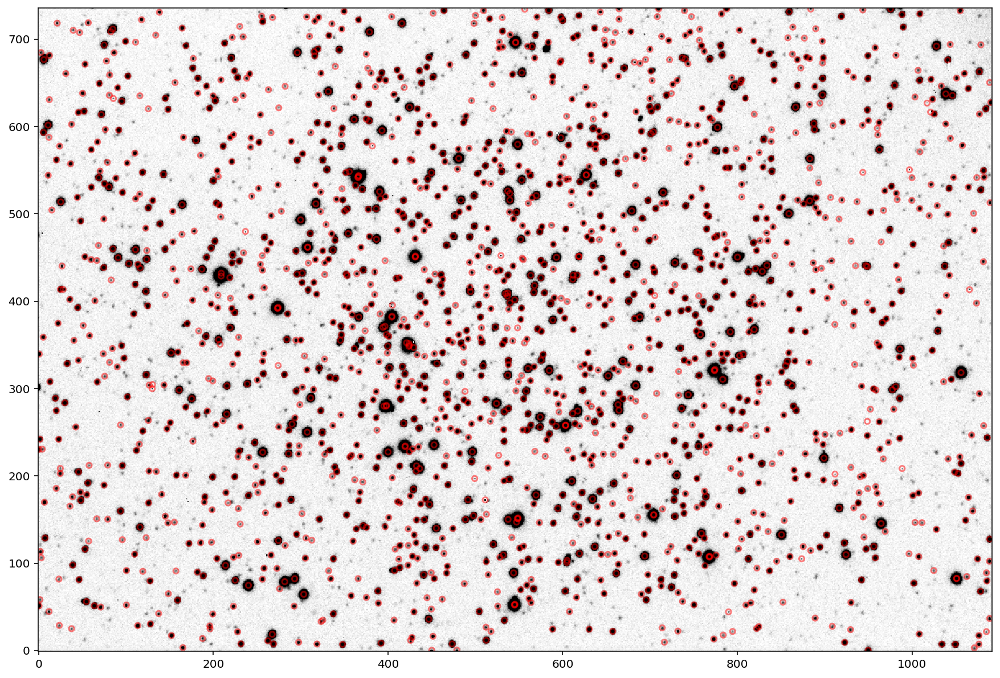

In [9]:
from photometry_helpers import plot_sources
help(plot_sources)
    
plot_sources(data, sources, 3)

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-pencil"></span>Tweak the detection settings</h2>
</div>
</section>

> The DAOFIND algorithm requires a threshold for star detection, and a typical FWHM of the stars in the images. Try different settings for these values, and see how they affect the detection of stars in your data. Make a decision about what values to use for this image.

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-pencil"></span>FWHM of stars in the image</h2>
</div>
</section>

We will also need an estimate for the FWHM of stars in the image. We can estimate this by-eye by plotting a bright, isolated, star and plotting the brightness against distance from the star's centre. I've written a clever little routine to do this. 

Using the plot created by the code below, estimate the FWHM of the star in pixels. You should be able to convert this to a value in arcseconds, using the information you recorded during observing, and the specifications of the [Hicks Observatory](https://sites.google.com/sheffield.ac.uk/astronomy/hicks-observatory)

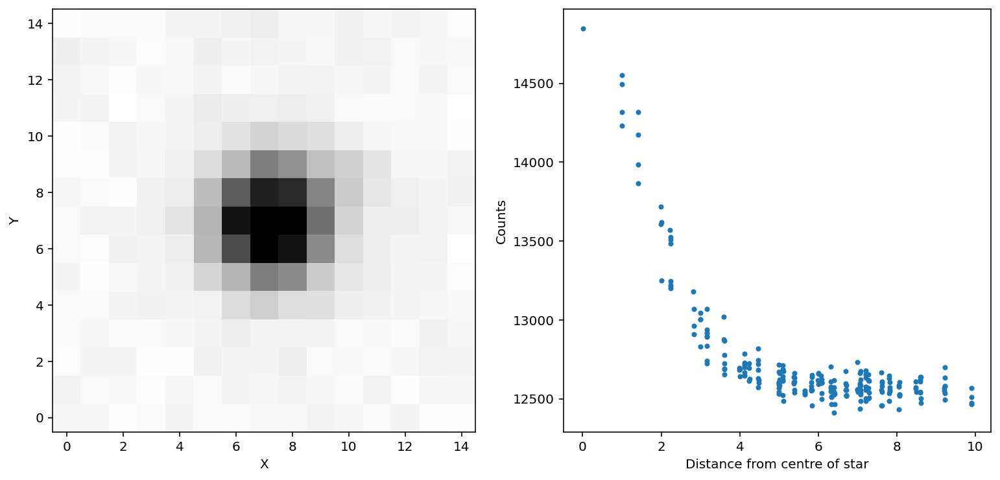

In [10]:
from photometry_helpers import measure_FWHM

measure_FWHM(data, sources)

# Aperture Photometry

So, we have a list of detected sources and positions in the image, and an idea of the FWHM of stars in the image. Now we can perform aperture photometry on all of these sources. I've written a function to do this for us. The comments in the function make it relatively easy to understand, so by all means take a look in the file `photometry_helpers.py` to see what the function does if you like. In brief the function performs the following steps:

1. Add up the counts from each source within a target aperture
2. Measure the sky brightness around each source using the sky annulus
3. Subtract the sky contribution from the counts in step 1.
4. Calculate instrumental magnitude from the counts and exposure time.

By now you should be getting quite good at reading documentation for functions you import, so let's import my function at look at the documentation.

In [11]:
from photometry_helpers import aperture_photometry
help(aperture_photometry)

Help on function aperture_photometry in module photometry_helpers:

aperture_photometry(data, header, sources, aperture_radius, sky_inner_radius, sky_outer_radius)
    Calculate Aperture Photometry on a list of sources
    
    Parameters
    ----------
    data:  `np.ndarray`
        A 2D array of pixel values of your data. From a FITS file, you can create this array with
        `fits.getdata`.
    
    header: `~astropy.fits.Header`
        A FITS Header object. From a FITS file, you can create this object with
        `fits.getheader`.
    
    sources: `~astropy.table.Table`
        A table of detected sources for the image. Usually, `photutils.DAOStarFinder` would be
        used to create this list.
    
    aperture_radius: float
        Radius of the target aperture, in pixels
    
    sky_inner_radius: float
        Radius of the inner aperture that makes up the sky annulus
    
    sky_outer_radius: float
        Radius of the outer aperture that makes up the sky annulus
   

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-pencil"></span>Perform Aperture Photometry</h2>
</div>
</section>

Using the help above, use this function to perform aperture photometry on all of your sources. You'll need to pick values for the aperture radii, remembering everything we've discussed in the course about how these choices affect the quality of your measurement. 

Target apertures want to be big enough to accept a decent fraction of the flux, but not so large that the measurements are very noisy, or contaminated by nearby stars. As a rule of thumb this aperture might have a radius of 1.5-2x the FWHM.

Sky Annuli want to be wide enough to accurately measure the sky, but not so large that the annuli overlap nearby stars.

To get started, try values around 5, 10, 20 pixels for these apertures. We will tweak them later on.

In [12]:
# YOUR CODE HERE. USE THE FUNCTION ABOVE TO PERFORM APERTURE PHOTOMETRY
V300 = aperture_photometry(data, header, sources, 5, 10, 20) 
# SAVE THE TABLE RETURNED IN A SUITABLY NAMED VARIABLE. Perhaps call it V300.

# Photometric Calibration

Now we have a table of instrumental magnitudes (and much besides) in it. The next step is photometric calibration. As a reminder, this involves fitting a straight line to a graph of *instrumental magnitude* against *calibrated magnitude*, to find the offset between the two. Equivalently, we can find the average value of the *difference* between the calibrated and instrumental magnitudes for all our stars.

Since we have instrumental magnitudes and sky positions (RA, Dec) for a number of stars, we must find the matching stars in an online catalog of calibrated magnitudes. We will use the [APASS](https://www.aavso.org/apass) catalog; a catalog which combines several other sky surveys to provide data in many filters across much of the sky. Crucially, in this case it includes B and V magnitudes, the two filters used for our photometry.

To perform the cross-matching we will use the [astroquery](https://astroquery.readthedocs.io/en/latest/) Python library, and we have our aperture photometry results in a [Table](http://docs.astropy.org/en/stable/table/) object from [astropy](http://www.astropy.org). 

In [13]:
from astropy import units as u
from astroquery.xmatch import XMatch

Could not import regions, which is required for some of the functionalities of this module.


Our photometry is stored as an astropy table, which is a handy object for reading and writing tabular data. These astropy tables play nicely with Jupyter notebooks, so you can simply type the name of the table in a code cell to see the table displayed in the browser. So, if you named your photometry table above ```V300``` the following cell will work. If not, replace the variable name below:

In [14]:
V300

id,xcenter,ycenter,aperture_sum,aperture_sum_err,sky_mean,aper_bkg,aper_sum_bksub,RA,DEC,instrumental_mag,e_instrumental_mag
,pix,pix,,,,,,,,,
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1,450.1709193760241,0.3880226773402493,613274.2821607713,896.7627345794019,6546.836504099991,514187.3366383504,99086.94552242092,359.30845514940125,56.61907252560987,-6.297237965583777,0.009050261160553049
2,478.89419941776816,0.5762631357085911,639555.492461868,915.7591073362786,6615.785732777475,519602.59639544704,119952.89606642094,359.3226414907986,56.61921386745884,-6.504723707601205,0.007634322616347668
3,949.8117754685048,0.36503649582442277,668676.4253870292,936.0414511119112,6518.6643764959035,511974.7029104255,156701.7224766037,359.55525335036356,56.62040541214033,-6.794881288928362,0.005973396056649387
4,165.2496454298732,3.3423657101402853,943073.2156594956,1112.0141472087325,7354.167424647708,577594.9588635652,365478.2567959303,359.1677069113511,56.618892608824474,-7.7143507252287495,0.0030426273698400627
5,1071.249859368704,3.0485143206828598,910783.1455810051,1092.8465302890327,7310.974963652827,574202.6309097656,336580.51467123954,359.61523045959893,56.62138597252419,-7.624919288648352,0.003246909677336753
6,348.04474005431854,7.131155178370917,1076966.1215255137,1188.0091077859397,8435.966010472113,662559.2211108097,414406.900414704,359.25797086439985,56.62057012490107,-7.8507643091164105,0.0028667696088001404
7,1034.1174172270996,7.352485478794329,1081159.3925166368,1190.3011771273914,8672.622222734011,681146.1565575189,400013.2359591179,359.59687193260726,56.6224810846864,-7.812382767826401,0.0029756544787159053
8,1049.4292719479813,7.122996880789271,1130243.172474711,1216.809682684952,8533.404467275459,670212.0196125726,460031.15286213835,359.6044367452124,56.622449553407165,-7.964164969893959,0.002645059307645637


The important columns for our uses are the measured centres of our stars in RA and Dec (**RA** and **DEC**) and the instrumental magnitude and uncertainty (**instrumental_mag** and **e_instrumental_mag**). Note that the magnitude uncertainty is calculated using the CCD signal-to-noise equation we saw in the [lectures](http://slittlefair.staff.shef.ac.uk/teaching/phy241/lectures/L09/index.html).

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-pencil"></span>X-match with APASS</h2>
</div>
</section>

> We need to calibrate our photometry, which will involve comparing our instrumental magnitudes to calibrated magnitudes measured for the same stars. We need to match our detected stars with those catalogued in the sky survey [APASS](https://www.aavso.org/apass). We are looking for stars who's RA and Dec matches to within some radius. A service called **Vizier** hosts online versions of astronomical catalogs, and we can use the ```Xmatch.query``` function to match an astropy table with a table hosted by Vizier using the code below.

> Run the code cell below, and note carefully how we specify the columns that contain RA and Dec in our *local* table, and how we set the maximum distance for a valid match. **II/336/apass9** is the name of the APASS catalog on Vizier. If you need to find the names of other catalogs (perhaps APASS doesn't cover the patch of sky containing your open cluster), you can enter the catalog name in the search box [here](http://vizier.u-strasbg.fr)

> **The code cell below may take a while to run. Be patient...**

In [15]:
xmatch = XMatch.query(cat1=V300, cat2='vizier:II/336/apass9', max_distance=2*u.arcsec, colRA1='RA', colDec1='DEC')

The result of this query (```xmatch```) is also an astropy ```Table```. It has all the columns from both tables for each valid match. If you want to extract a column and save it into a variable, you can access the ```Table``` like a dictionary. So the code below extracts the **Magnitude** column (which is instrumental magnitude from our APT photometry) and **Vmag** column from UCAC4 and computes the difference.

In [16]:
delta_mag = xmatch['Vmag'] - xmatch['instrumental_mag']

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-pencil"></span>Plot the difference and find the zero-point</h2>
</div>
</section>

> Plot the difference between instrumental and calibrated magnitude found above, against the calibrated V-band magnitude on the X-axis. You should see something like the figure below:

<img src="../../images/V_zeropoint.png" style="margin: 0px" width=750px/>

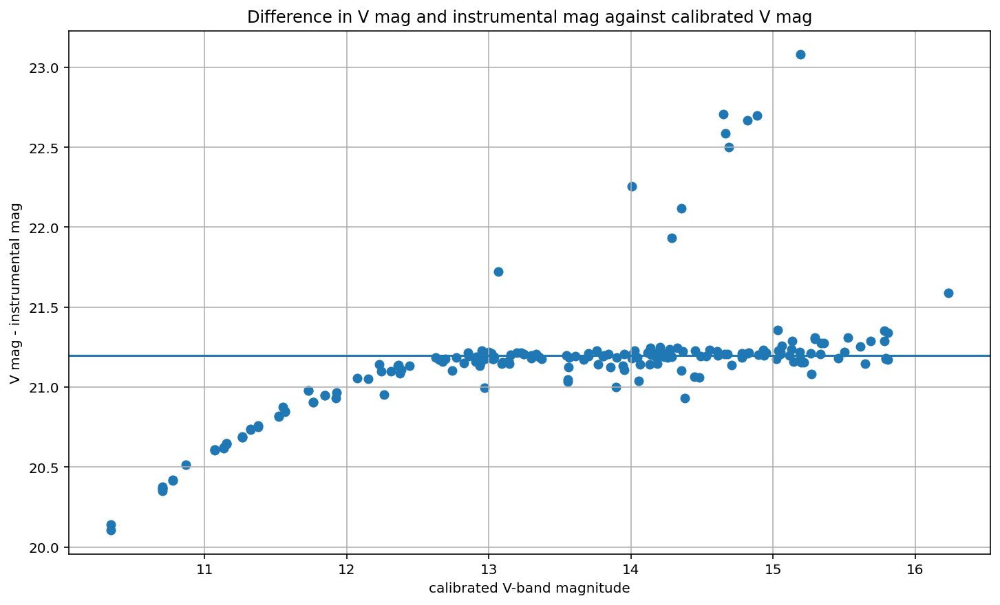

In [21]:
import matplotlib.pyplot as plt
plt.scatter(xmatch['Vmag'], delta_mag)
plt.xlabel("calibrated V-band magnitude")
plt.ylabel("V mag - instrumental mag")
plt.title("Difference in V mag and instrumental mag against calibrated V mag")
plt.axhline(21.2)
plt.grid()

The magnitude difference between instrumental and calibrated magnitude *should* be a constant, which is the value of $kX + m_{\rm zp}$. In the figure above, you can see there are plenty of outlying points, and the bright stars deviate from the constant. The outliers are either stars whose photometry is bad (poor sky estimation, or contaminated by very close stars), or spurious detections (i.e not stars). The deviation of the bright stars is caused because they are [saturated](http://slittlefair.staff.shef.ac.uk/teaching/phy241/lectures/L06/index.html#readout), and so we cannot accurately measure their flux.

Since $m = m_i - kX + m_{\rm zp}$, we can find the value of $-kX + m_{\rm zp}$. - which I'll call the *zeropoint* from now on - by calculating the **median** difference between the instrumental and calibrated magnitude. The median will be robust against the outliers - but we only want to do it for the non-saturated stars!

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-pencil"></span>Calculate the zero-point</h2>
</div>
</section>

> Calculate the median value of ```delta_mag```. **If you have evidence for saturated stars**, use a NumPy *mask* to only calculate the median of stars that are not saturated (see notes on Fancy slicing in the NumPy notebook).

> The median value of ```delta_mag``` is our estimate of $-kX + m_{\rm zp}$ - i.e the value we want to add to our instrumental magnitudes to get a calibrated magnitude. You can add this value to the **instrumental_mag** column of the V300 table easily using ```V300['calibrated_mag'] = V300['instrumental_mag'] + zp```, where ```zp``` is the median value you found.

In [18]:
# CALCULATE THE ZEROPOINT AND ADD IT TO THE MAGNITUDE COLUMN OF THE V300 table
import numpy as np
mask = xmatch["Vmag"] >= 12.7
mag = xmatch["Vmag"]
ZP = delta_mag[mask]
ZP_median = np.median(ZP)
V300['calibrated_mag'] = V300['instrumental_mag'] + ZP_median
print(f"The median for the masked zero point is {np.median(ZP)}")
V300

The median for the masked zero point is 21.19673186627411


/home/user/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedColumn.
  a.partition(kth, axis=axis, kind=kind, order=order)


id,xcenter,ycenter,aperture_sum,aperture_sum_err,sky_mean,aper_bkg,aper_sum_bksub,RA,DEC,instrumental_mag,e_instrumental_mag,calibrated_mag
,pix,pix,,,,,,,,,,
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1,450.1709193760241,0.3880226773402493,613274.2821607713,896.7627345794019,6546.836504099991,514187.3366383504,99086.94552242092,359.30845514940125,56.61907252560987,-6.297237965583777,0.009050261160553049,14.899493900690333
2,478.89419941776816,0.5762631357085911,639555.492461868,915.7591073362786,6615.785732777475,519602.59639544704,119952.89606642094,359.3226414907986,56.61921386745884,-6.504723707601205,0.007634322616347668,14.692008158672905
3,949.8117754685048,0.36503649582442277,668676.4253870292,936.0414511119112,6518.6643764959035,511974.7029104255,156701.7224766037,359.55525335036356,56.62040541214033,-6.794881288928362,0.005973396056649387,14.401850577345748
4,165.2496454298732,3.3423657101402853,943073.2156594956,1112.0141472087325,7354.167424647708,577594.9588635652,365478.2567959303,359.1677069113511,56.618892608824474,-7.7143507252287495,0.0030426273698400627,13.48238114104536
5,1071.249859368704,3.0485143206828598,910783.1455810051,1092.8465302890327,7310.974963652827,574202.6309097656,336580.51467123954,359.61523045959893,56.62138597252419,-7.624919288648352,0.003246909677336753,13.571812577625758
6,348.04474005431854,7.131155178370917,1076966.1215255137,1188.0091077859397,8435.966010472113,662559.2211108097,414406.900414704,359.25797086439985,56.62057012490107,-7.8507643091164105,0.0028667696088001404,13.3459675571577
7,1034.1174172270996,7.352485478794329,1081159.3925166368,1190.3011771273914,8672.622222734011,681146.1565575189,400013.2359591179,359.59687193260726,56.6224810846864,-7.812382767826401,0.0029756544787159053,13.384349098447709
8,1049.4292719479813,7.122996880789271,1130243.172474711,1216.809682684952,8533.404467275459,670212.0196125726,460031.15286213835,359.6044367452124,56.622449553407165,-7.964164969893959,0.002645059307645637,13.23256689638015


---------
<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h1>Homework #6</h1>
<h2><span class="fa fa-pencil"></span>The B-band data and making a CMD</h2>
</div>
</section>

> Your task in the homework is to repeat the steps above for the rest of your data, and make two CMDs, one for the 30s data, and one for the 300s data.

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-question"></span>  The B-band data (4 points)</h2>
</div>
</section>

> Repeat the steps above for the 300-second B-band data. Make a plot of the difference between instrumental B-band magnitude and APASS B-band magnitude. Calculate the offset needed to correct your instrumental mags (zeropoint) and display it on your plot.

> Finally, add your zeropoint to the **instrumental_mag** column of the 300s B-band table to make a new **calibrated_mag** column.

In [19]:
def create_table_data(image_data, image_header):
    """
    A function that reads in FITS image and header data and creates a sources plot, FWHM plot, and returns a table of data 
    
    Parameters
    ---------------
    data: FITS image data
    
    header: FITS header data 
    
    filtermag: Filter column magnitude
    String value of either 'Bmag' or Vmag
    Returns
    ----------------
    Table of photometry data 
   
    """    
    mean_background, median_background, background_standard_deviation = sigma_clipped_stats(image_data, sigma=3.0)
    print(f"The background has an average value of {mean_background:.1f} and a standard deviation of {background_standard_deviation:.1f} counts")
    
    #Create  sources
    image_sources = daofind(image_data - median_background)

    #Plot B300 sources
    plot_sources(image_data, image_sources, 3)
    measure_FWHM(image_data, image_sources)

    #Create  table
    table = aperture_photometry(image_data, image_header, image_sources, 5, 10, 20)
    
    return 
    table

In [20]:
#Read in B_300, B_30 and V_30 files
B_300 = '../../observing_project/B_300_calib'
V_30 = '../../observing_project/V_30_calib'
B_30 = '../../observing_project/B_30_calib'

file_list = [B_300, V_30, B_30]


#Create data and header objects of files
B_300_data = fits.getdata(B_300)
B_300_header  = fits.getheader(B_300)

B_30_data = fits.getdata(B_30)
B_30_header  = fits.getheader(B_30)

V_30_data = fits.getdata(V_30)
V_30_header  = fits.getheader(V_30)


The background has an average value of 4614.2 and a standard deviation of 38.9 counts


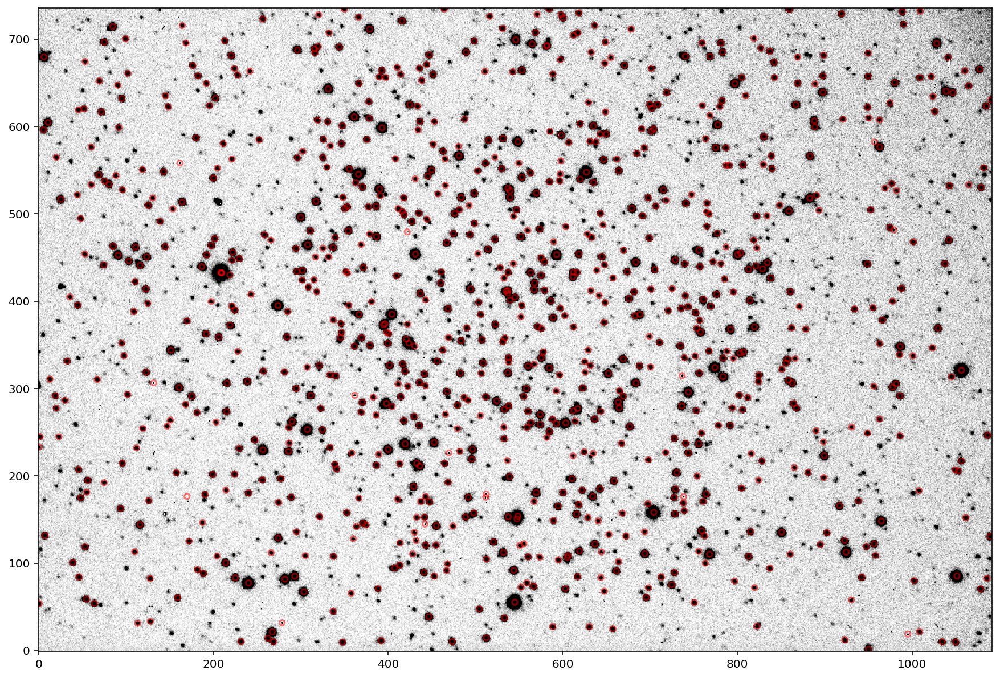

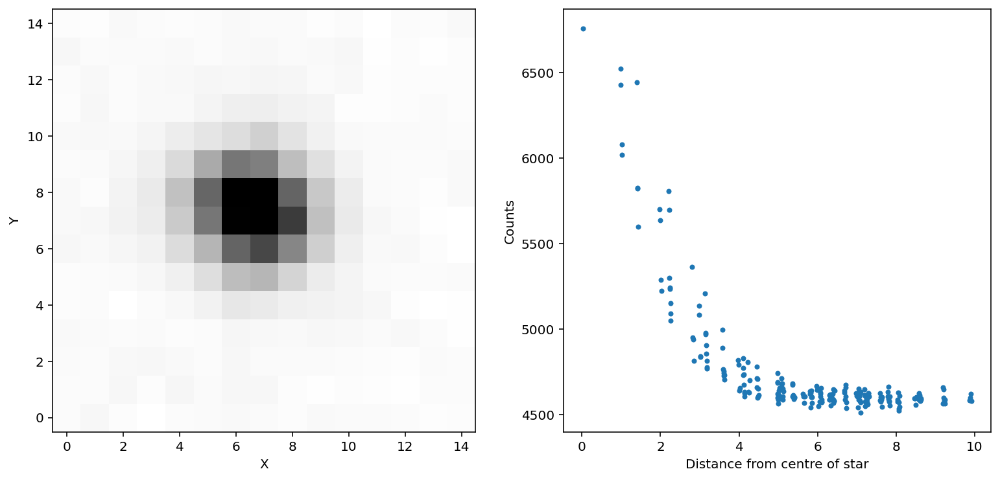

In [21]:
mean_background, median_background, background_standard_deviation = sigma_clipped_stats(B_300_data, sigma=3.0)
print("The background has an average value of {:.1f} and a standard deviation of {:.1f} counts".format(mean_background, background_standard_deviation))

#Create B300 sources
B_300_sources = daofind(B_300_data - median_background)

#Plot B300 sources
plot_sources(B_300_data, B_300_sources, 3)
measure_FWHM(B_300_data, B_300_sources)

#Create B300 table
B300 = aperture_photometry(B_300_data, B_300_header, B_300_sources, 5, 10, 20) 

The background has an average value of 486.9 and a standard deviation of 13.0 counts


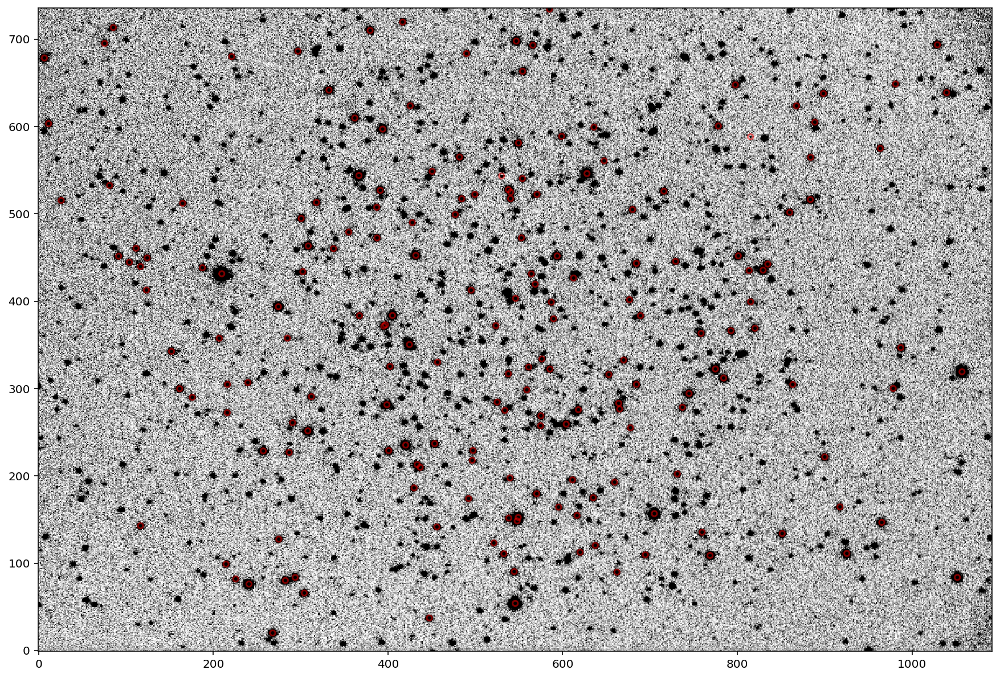

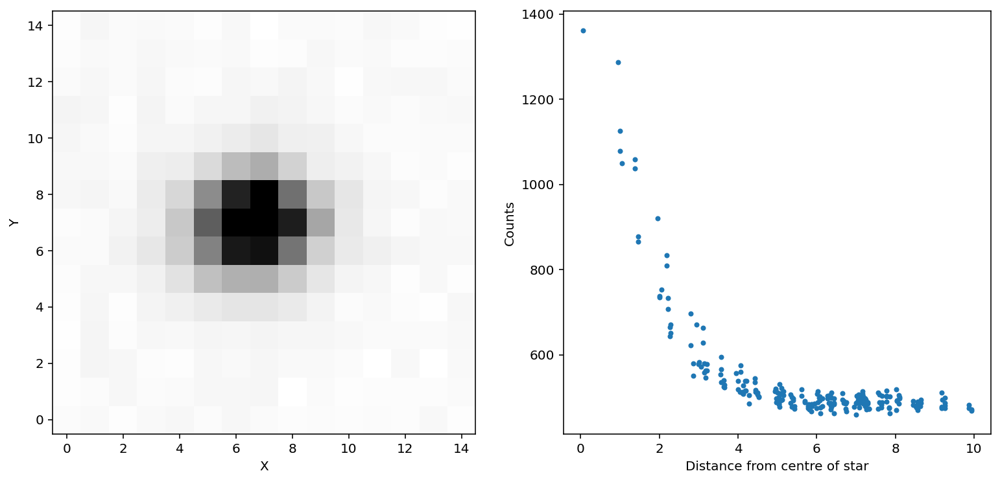

In [22]:
mean_background, median_background, background_standard_deviation = sigma_clipped_stats(B_30_data, sigma=3.0)
print("The background has an average value of {:.1f} and a standard deviation of {:.1f} counts".format(mean_background, background_standard_deviation))

#Create B30 sources
B_30_sources = daofind(B_30_data - median_background)

#Plot B30 sources
plot_sources(B_30_data, B_30_sources, 3)
measure_FWHM(B_30_data, B_30_sources)

#Create B30 table
B30 = aperture_photometry(B_30_data, B_30_header, B_30_sources, 5, 10, 20) 

The background has an average value of 1311.3 and a standard deviation of 20.2 counts


id,xcenter,ycenter,aperture_sum,aperture_sum_err,sky_mean,aper_bkg,aper_sum_bksub,RA,DEC,instrumental_mag,e_instrumental_mag
,pix,pix,,,,,,,,,
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1,950.0375204773163,0.3886256633949748,70576.65220200509,314.12953307187405,680.1788049133763,53421.11841608371,17155.533785921383,359.5552624522192,56.62026752584726,-6.893207451850175,0.018310682546623127
2,348.2575482264078,7.20286579499571,113184.43698825758,398.05715197770735,879.2005020425461,69052.24595623302,44132.191032024566,359.25798237777065,56.62042794083401,-7.919085586730262,0.009019655327986249
3,1049.5748779071414,7.336683069002547,117661.55385253901,405.30204533247036,893.6480072795927,70186.95036411817,47474.60348842085,359.6044036312153,56.62236707578502,-7.99835022860816,0.008537239187923377
4,231.9442484946911,8.10643597515521,112593.29345017544,397.0906819220072,913.479375797477,71744.50240527859,40848.79104489685,359.20052621996155,56.62026486579352,-7.835144882550654,0.009720989820373518
5,269.14054386541005,7.875793062418203,114455.97692332344,400.1281021067595,923.3236220869751,72517.66770085899,41938.30922246445,359.2188999147855,56.620335740702025,-7.863724157055661,0.009540873476425918
6,473.6569056154273,7.928820358868076,120118.34787845405,409.22314214524124,904.1844801484151,71014.48300810417,49103.86487034988,359.3199176714754,56.62103607988119,-8.034986053070845,0.008333827555646038
7,1034.3366890733703,7.6769017506455715,112572.81993986912,397.05716730322695,911.5022030421628,71589.21562020427,40983.60431966485,359.5968750075038,56.62242841233987,-7.83872223807263,0.009688195411175927
8,392.34433142386496,8.98861163322726,113511.04548461996,398.59012440137144,946.4484850001877,74333.89018694448,39177.155297675476,359.2797475836486,56.62106114349185,-7.789779108543753,0.01017404457707069


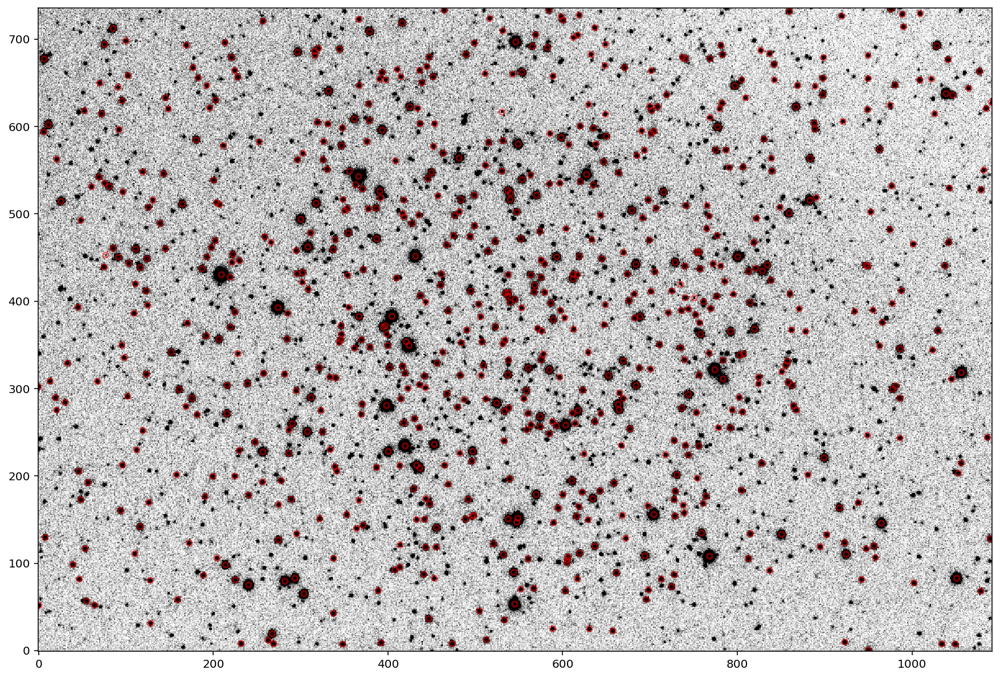

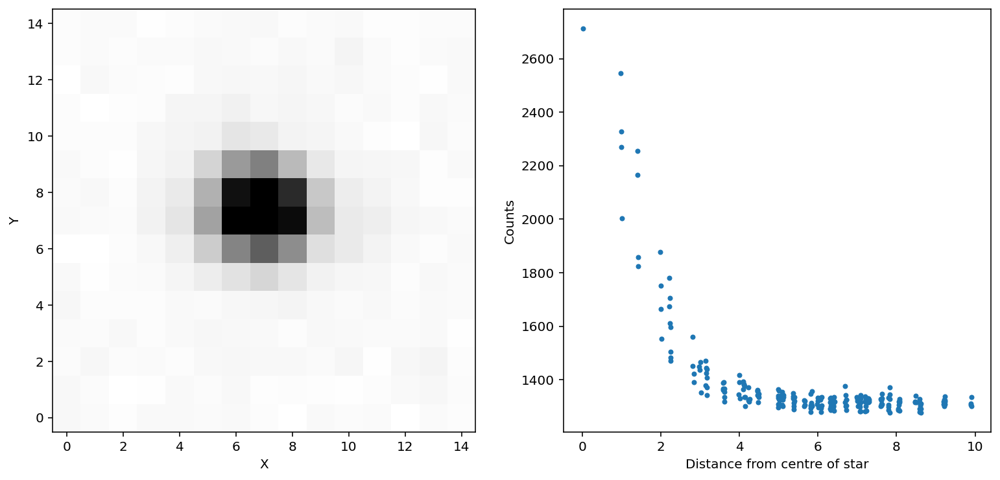

In [23]:
mean_background, median_background, background_standard_deviation = sigma_clipped_stats(V_30_data, sigma=3.0)
print("The background has an average value of {:.1f} and a standard deviation of {:.1f} counts".format(mean_background, background_standard_deviation))

#Create V30 sources
V_30_sources = daofind(V_30_data - median_background)

#Plot V30 sources
plot_sources(V_30_data, V_30_sources, 3)
measure_FWHM(V_30_data, V_30_sources)

#Create V30 table
V30 = aperture_photometry(V_30_data, V_30_header, V_30_sources, 5, 10, 20) 
V30

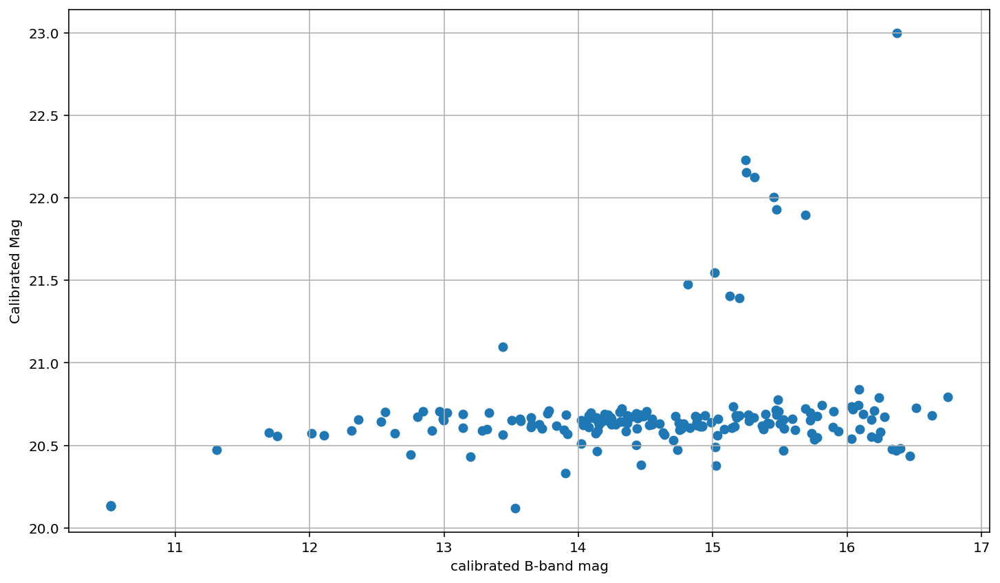

In [24]:
#B300 Xmatch
B_300_xmatch = XMatch.query(cat1=B300, cat2='vizier:II/336/apass9', max_distance=2*u.arcsec, colRA1='RA', colDec1='DEC')
B_300_delta_mag = B_300_xmatch['Bmag'] - B_300_xmatch['instrumental_mag']
plt.scatter(B_300_xmatch['Bmag'], B_300_delta_mag)
plt.xlabel("calibrated B-band mag")
plt.ylabel("Calibrated Mag")
plt.grid()

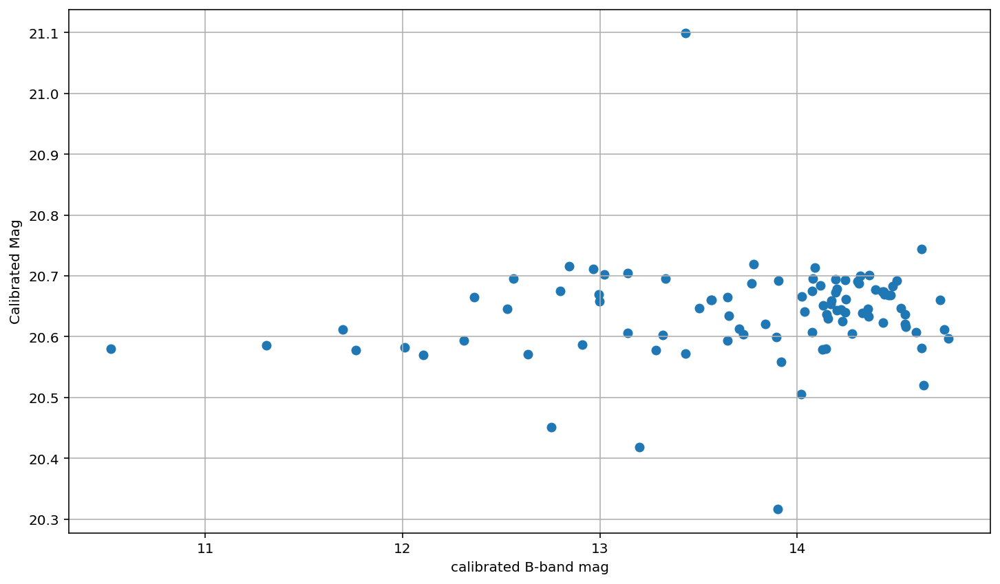

In [25]:
#B30 Xmatch 
B_30_xmatch = XMatch.query(cat1=B30, cat2='vizier:II/336/apass9', max_distance=2*u.arcsec, colRA1='RA', colDec1='DEC')
B_30_delta_mag = B_30_xmatch['Bmag'] - B_30_xmatch['instrumental_mag']
plt.scatter(B_30_xmatch['Bmag'], B_30_delta_mag)
plt.xlabel("calibrated B-band mag")
plt.ylabel("Calibrated Mag")
plt.grid()

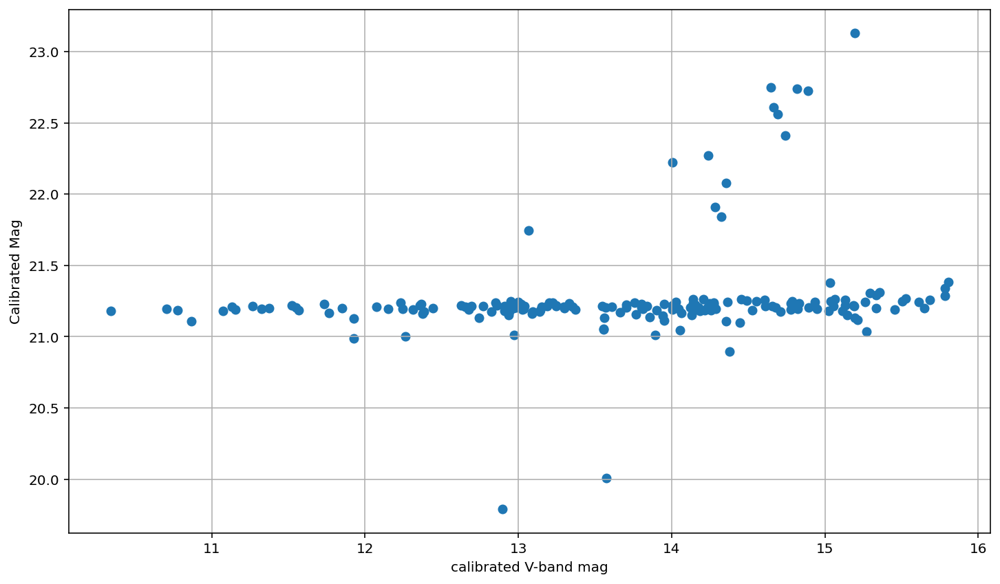

In [26]:
#V30 Xmatch 
V_30_xmatch = XMatch.query(cat1=V30, cat2='vizier:II/336/apass9', max_distance=2*u.arcsec, colRA1='RA', colDec1='DEC')
V_30_delta_mag = V_30_xmatch['Vmag'] - V_30_xmatch['instrumental_mag']
plt.scatter(V_30_xmatch['Vmag'], V_30_delta_mag)
plt.xlabel("calibrated V-band mag")
plt.ylabel("Calibrated Mag")
plt.grid()

In [27]:
#B300 mask and Zero point calculation
mask = (B_300_xmatch["Bmag"] >= 12)
mag = B_300_delta_mag
ZP = B_300_delta_mag[mask]
ZP_median_B300 = np.median(ZP)
print(f"The median for the masked zero point is {ZP_median_B300}")
B300['calibrated_mag'] = B300['instrumental_mag'] + ZP_median_B300
B300

The median for the masked zero point is 20.64745921069452


/home/user/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedColumn.
  a.partition(kth, axis=axis, kind=kind, order=order)


id,xcenter,ycenter,aperture_sum,aperture_sum_err,sky_mean,aper_bkg,aper_sum_bksub,RA,DEC,instrumental_mag,e_instrumental_mag,calibrated_mag
,pix,pix,,,,,,,,,,
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1,950.2147251967295,1.485898374638976,326555.2732997457,657.9964478701512,2503.7183911951415,196641.58261090782,129913.69068883787,359.5553725233513,56.61982266034955,-6.591334165004127,0.005064873797220865,14.056125045690393
2,231.86138793169647,10.404042913612098,394999.12990487966,724.4367353980889,3568.276290668575,280251.7645185758,114747.36538630386,359.2005665082538,56.62019475279378,-6.456553670372772,0.006313319115948583,14.190905540321749
3,269.01762987183884,10.20132875908336,400222.7598597241,729.1085668722155,3605.993623927806,283214.0769455808,117008.68291414331,359.21891700646654,56.6202705631378,-6.477742090253852,0.006231234714497288,14.16971712044067
4,348.14109184359,9.731975591992512,394417.94802605634,723.9150828512162,3428.029560962597,269236.81212521845,125181.1359008379,359.25799451231,56.62041275864772,-6.5510440833215995,0.005782940677456903,14.096415127372921
5,473.6270941640233,10.300861715991967,416394.90737476543,743.3862342583847,3535.267949964973,277659.2955020352,138735.61187273025,359.31996280020957,56.620970223634274,-6.662666747943677,0.00535829427083461,13.984792462750843
6,1034.5276765768167,10.101035770946819,394977.8477761071,724.417639782364,3578.9700851502394,281091.6531731407,113886.19460296637,359.5969801998982,56.62233983115448,-6.448374567359652,0.006360890732259968,14.199084643334869
7,1049.7642041601173,9.85037545793739,410170.4310777228,737.9236236871079,3516.593476840213,276192.605812575,133977.82526514778,359.60450631345594,56.62230177299949,-6.62477917325646,0.005507804162567394,14.022680037438061
8,392.31105736421193,11.324556484496693,397686.3100689307,726.8438055589194,3696.432478013892,290317.12793547893,107369.18213345174,359.27979836645443,56.620991050111805,-6.384395975594978,0.006769575693102586,14.263063235099544


In [28]:
# B30 mask and Zero point calculation
mask = (B_30_xmatch["Bmag"] >= 11)
mag = B_30_delta_mag
ZP = B_30_delta_mag[mask]
ZP_median_B30 = np.median(ZP)
print(f"The median for the masked zero point is {ZP_median_B30}")
B30['calibrated_mag'] = B30['instrumental_mag'] + ZP_median_B30
B30

The median for the masked zero point is 20.64583731763862


id,xcenter,ycenter,aperture_sum,aperture_sum_err,sky_mean,aper_bkg,aper_sum_bksub,RA,DEC,instrumental_mag,e_instrumental_mag,calibrated_mag
,pix,pix,,,,,,,,,,
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1,268.02736675955174,20.149766446447885,61767.39223096698,302.6670456258519,483.8261654823791,37999.618177349046,23767.774053617934,359.2180153456031,56.62336152646407,-7.247168138777317,0.012734345460498852,13.398669178861303
2,447.4126333769818,37.3414972553207,48869.15532358869,273.5683335902122,484.2084280222172,38029.64100702149,10839.514316567198,359.3064996053953,56.62863809484198,-6.394721421483451,0.025238061927930502,14.251115896155168
3,545.7080019283434,53.98664900274596,192596.8190774953,511.5521372938785,488.6028167761564,38374.775492681314,154222.043584814,359.3549563204108,56.633467085651,-9.277562997277917,0.0033169845594255257,11.368274320360703
4,304.2721889165446,65.91196588179768,57799.97189305286,294.0232886316567,484.35189201882804,38040.90864296667,19759.06325008619,359.2356250342082,56.63592989075385,-7.04661274179522,0.014880426511635068,13.599224575843401
5,240.92083966983117,76.15503283230126,99865.842324329,375.6798155511905,486.1332918135038,38180.81945566816,61685.02286866084,359.20426422118624,56.63849128947169,-8.282646188394304,0.006090292231083132,12.363191129244315
6,282.5320356896614,80.30689922776746,62056.764485407664,303.2878573646761,486.491220617358,38208.93111818558,23847.833367222083,359.2247940338126,56.63976771029375,-7.25081918438724,0.01271762732884294,13.39501813325138
7,225.76382783895122,81.99753980670626,47281.33643164313,269.76928783593866,486.06783601260406,38175.67856908713,9105.657862556,359.19673807963846,56.640025084150565,-6.205475183271978,0.02962655657701301,14.44036213436664
8,293.7582716078041,83.70889597006358,59953.83636348944,298.7469128989249,485.97998240457326,38168.77856284761,21785.05780064183,359.23031851099273,56.64073187645059,-7.152593654585634,0.013713386286729213,13.493243663052986


In [29]:
# V30 Mask and Zero point calculation
mask = (V_30_xmatch["Vmag"] >= 11)
mag = V_30_delta_mag
ZP = V_30_delta_mag[mask]
ZP_median_V30 = np.median(ZP)
print(f"The median for the masked zero point is {ZP_median_V30}")
V30['calibrated_mag'] = V30['instrumental_mag'] + ZP_median_V30
V30

The median for the masked zero point is 21.207868147032755


id,xcenter,ycenter,aperture_sum,aperture_sum_err,sky_mean,aper_bkg,aper_sum_bksub,RA,DEC,instrumental_mag,e_instrumental_mag,calibrated_mag
,pix,pix,,,,,,,,,,
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1,950.0375204773163,0.3886256633949748,70576.65220200509,314.12953307187405,680.1788049133763,53421.11841608371,17155.533785921383,359.5552624522192,56.62026752584726,-6.893207451850175,0.018310682546623127,14.31466069518258
2,348.2575482264078,7.20286579499571,113184.43698825758,398.05715197770735,879.2005020425461,69052.24595623302,44132.191032024566,359.25798237777065,56.62042794083401,-7.919085586730262,0.009019655327986249,13.288782560302494
3,1049.5748779071414,7.336683069002547,117661.55385253901,405.30204533247036,893.6480072795927,70186.95036411817,47474.60348842085,359.6044036312153,56.62236707578502,-7.99835022860816,0.008537239187923377,13.209517918424595
4,231.9442484946911,8.10643597515521,112593.29345017544,397.0906819220072,913.479375797477,71744.50240527859,40848.79104489685,359.20052621996155,56.62026486579352,-7.835144882550654,0.009720989820373518,13.3727232644821
5,269.14054386541005,7.875793062418203,114455.97692332344,400.1281021067595,923.3236220869751,72517.66770085899,41938.30922246445,359.2188999147855,56.620335740702025,-7.863724157055661,0.009540873476425918,13.344143989977095
6,473.6569056154273,7.928820358868076,120118.34787845405,409.22314214524124,904.1844801484151,71014.48300810417,49103.86487034988,359.3199176714754,56.62103607988119,-8.034986053070845,0.008333827555646038,13.17288209396191
7,1034.3366890733703,7.6769017506455715,112572.81993986912,397.05716730322695,911.5022030421628,71589.21562020427,40983.60431966485,359.5968750075038,56.62242841233987,-7.83872223807263,0.009688195411175927,13.369145908960125
8,392.34433142386496,8.98861163322726,113511.04548461996,398.59012440137144,946.4484850001877,74333.89018694448,39177.155297675476,359.2797475836486,56.62106114349185,-7.789779108543753,0.01017404457707069,13.418089038489002


Now you should have a two astropy tables in computer memory. One with corrected (calibrated) V-band magnitudes and one with corrected (calibrated) B-band magnitudes. We need to cross-match these tables with each other, to find which stars in the V-band table match with stars in the B-band table. We can't use ```astroquery```'s Xmatch for this, since they are both local tables. Instead, we will use the ```SkyCoord``` object from astropy, which is meant to work with coordinates on the sky. You can create a ```SkyCoord``` object with positions of all of the stars in a table like so:

```python
from astropy.coordinates import SkyCoord

coo_v = SkyCoord(V300['RA'], V300['DEC'], unit=u.deg)
```

The ```SkyCoord``` you made is a bit like a NumPy array, but it is an array of positions on the sky. It carries within it several useful functions, including one to match positions against another sky coordinate object - ```match_coordinates_sky```. It's usage is shown below, and the documentation is [here](http://docs.astropy.org/en/stable/coordinates/matchsep.html#matching-catalogs). ```match_coordinates_sky``` returns an array of indices and the 2D and 3D separations of the matches. The array of indices can be used as a slice to sort the second set of coordinates, or the table from which it came, so that each row of the sorted coordinate/table contains the closest match of the corresponding row. Perhaps an example will explain:

```python
# match every entry in coo_v with the nearest entry in coo_v
idx, distance_2d, distance_3d = coo_v.match_to_catalog_sky(coo_b)

# using idx as a slice for the table B300 will sort it so that B300[0] is the closest match to V300[0]
B300 = B300[idx]
```

We are not quite done yet though - we have found the closest match to every object in the V300 table, but some of those matches may be quite far away. We could create a *fancy slicing mask* of True and False values by comparing the ```distance_2d``` array to some threshold separation, and use that mask to remove the rows where there is no close cross-match:

```python
mask = distance_2d < 3 * u.arcsec
B300 = B300[mask]
V300 = V300[mask]
```



<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-question"></span>Cross-matching your V and B-band tables (2 points)<h2>
</div>
</section>

> Create ```SkyCoord``` objects from your 300s B and V tables. Match them using ```match_coordinates_sky```, and use a mask to remove all rows where there is no good match.

In [30]:
from astropy.coordinates import SkyCoord

coo_V300 = SkyCoord(V300['RA'], V300['DEC'], unit=u.deg)
coo_B300 = SkyCoord(B300['RA'], B300['DEC'], unit=u.deg)
idx, distance_2d, distance_3d = coo_V300.match_to_catalog_sky(coo_B300)
B300 = B300[idx]
mask = distance_2d < 3 * u.arcsec
B300 = B300[mask]
V300 = V300[mask]

In [31]:
coo_V30 = SkyCoord(V30['RA'], V30['DEC'], unit=u.deg)
coo_B30 = SkyCoord(B30['RA'], B30['DEC'], unit=u.deg)
idx, distance_2d, distance_3d = coo_V30.match_to_catalog_sky(coo_B30)
B30 = B30[idx]
mask = distance_2d < 3 * u.arcsec
B30 = B30[mask]
V30 = V30[mask]

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-question"></span>Plotting your CMD (3 points)</h2>
</div>
</section>

> With your matched tables in hand, extract the calibrated magnitude columns from each into two arrays called ```V``` and ```B```. Calculate ```B-V``` and plot a colour-magnitude diagram of ```B-V``` against ```V```. Your plot should look something like the one below, which is for the cluster NGC 7789.

<img src="../../images/CMD.png" style="margin: 0px" width=750px/>

> Also calculate error bars on ```B-V```: remember that $\Delta (x+y)^2 = \Delta x^2 + \Delta y^2$

> Hint: you can reverse the y-axis with ```plt.gca().invert_yaxis()```

(955,)


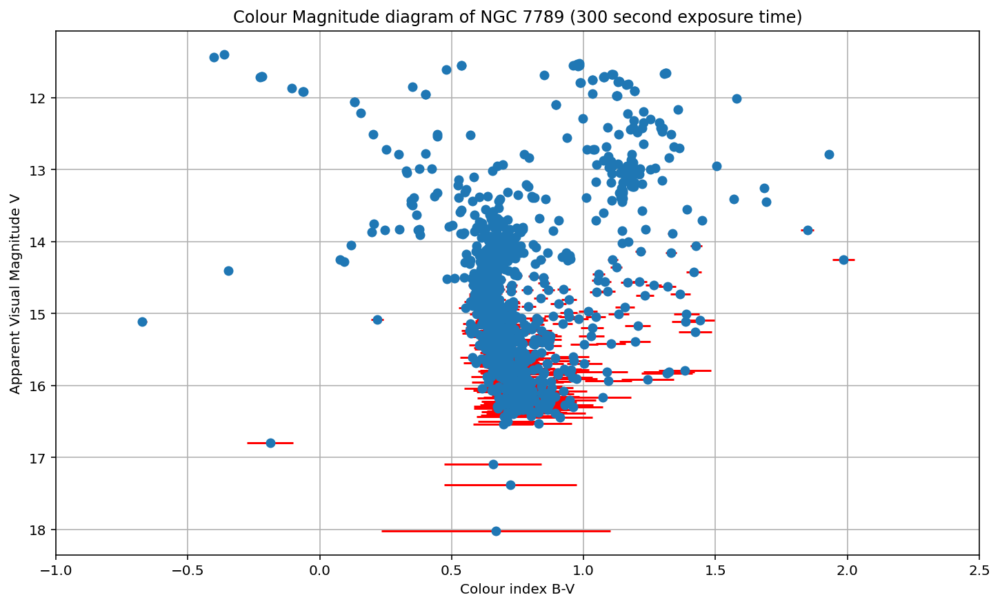

In [33]:
#Create arryas of V and B calibrated data 
V300_mag = V300['calibrated_mag']
B300_mag = B300['calibrated_mag']

# Load in error on instrumental magnitude for B and V 
V300_error = V300['e_instrumental_mag']
B300_error = B300['e_instrumental_mag']

# Calculate B-V
B_minus_V_300 = B300_mag - V300_mag

#Calculate error on B-Vv
error300 = np.sqrt((V300_error**2) + (B300_error**2))
print(error300.shape)

#Plot V against B-V
#plt.scatter(B_minus_V, V)
plt.errorbar(B_minus_V_300, V300_mag, xerr=error300, fmt="o", ecolor="r")
plt.xlim(-1, 2.5)

#Invert Y axis
plt.gca().invert_yaxis()

#Plot formatting
plt.xlabel("Colour index B-V")
plt.ylabel("Apparent Visual Magnitude V")
plt.title("Colour Magnitude diagram of NGC 7789 (300 second exposure time)")
plt.grid()

plt.show()

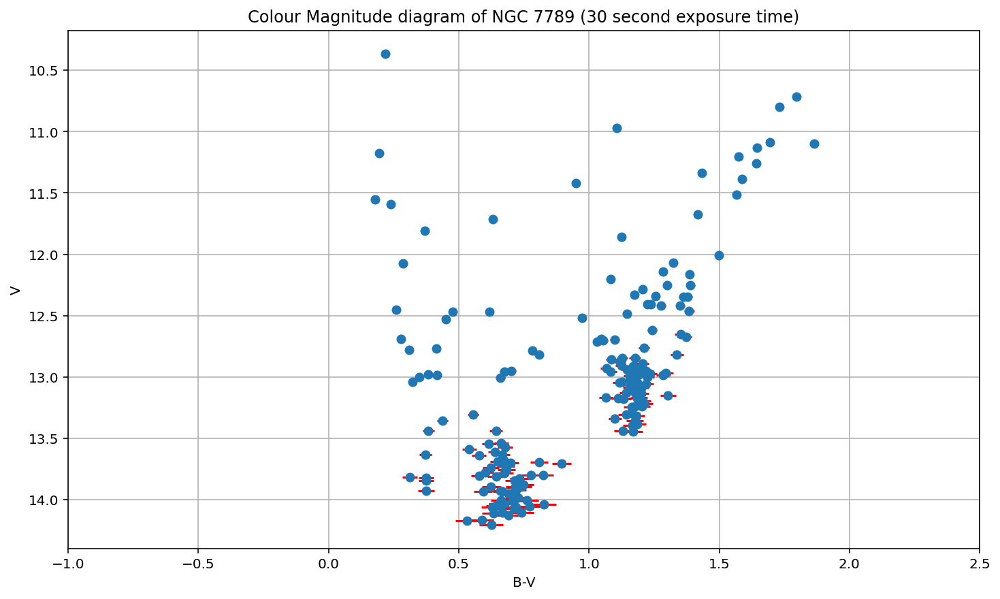

In [34]:
#Create arryas of V and B calibrated data 
V30_mag = V30['calibrated_mag']
B30_mag = B30['calibrated_mag']

# Load in error on instrumental magnitude for B and V 
V30_error = V30['e_instrumental_mag']
B30_error = B30['e_instrumental_mag']

# Calculate B-V
B_minus_V_30 = B30_mag-V30_mag

#Calculate error on B-Vv
error30 = np.sqrt((V30_error**2) + (B30_error**2))

#Plot V against B-V
#plt.scatter(B_minus_V, V)
plt.errorbar(B_minus_V_30, V30_mag, xerr=error30, fmt="o", ecolor="r")
plt.xlim(-1, 2.5)

#Invert Y axis
plt.gca().invert_yaxis()

#Plot formatting
plt.xlabel("B-V")
plt.ylabel("V")
plt.title("Colour Magnitude diagram of NGC 7789 (30 second exposure time)")
plt.grid()

plt.show()

<section class="challenge panel panel-success"> 
<div class="panel-heading">
<h2><span class="fa fa-question"></span>Save your data (1 point)</h2>
</div>
</section>

> Save your ```V``` and ```B-V``` data, along with their uncertainties, to a text file, for use in the next lab!

> You might want to revisit Session1 for instructions for writing data to a file. Or, you could create an astropy Table using the instructions [here](https://docs.astropy.org/en/stable/table/construct_table.html) and [here](https://docs.astropy.org/en/stable/table/io.html)


In [0]:
#Stack V_mag, BV mag and error coloumns into 1d NP array 
data_out300 = np.column_stack([V300_mag, B_minus_V_300, error300])
data_out30 = np.column_stack([V30_mag, B_minus_V_30, error30])

#Create file path to save data to 
filepath300 = '../../observing_project/calibrated_data_300'
filepath30 = '../../observing_project/calibrated_data_30'

#Save 1d arrays to filepaths
np.savetxt(f"{filepath300}.csv", data_out300, delimiter=',', header="V, B-V, B-V_Error")
np.savetxt(f"{filepath30}.csv", data_out30, delimiter=',', header="V, B-V, Error")